# Introduction to APIs & USDA QuickStats

### A guiding question: Which counties have more cows than humans?

- Introduce the USDA QuickStats Database
- Quickstats API is an alternative...

### APIs
- Introduce APIs and OpenNotify as minimal example
- Quick intro to QuickStats API

### Finally:
- Determine which counties have more cows than humans
- Plus Some more Geopandas spatial operations

In [129]:
#First load geopandas plus other standard libraries
#####

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

### Setup: County geometries and demographics

- Get shapefiles from Census
- Demographics from Census
- Merge and plot quickly as a check

### Re-load State/County geometries + demographics

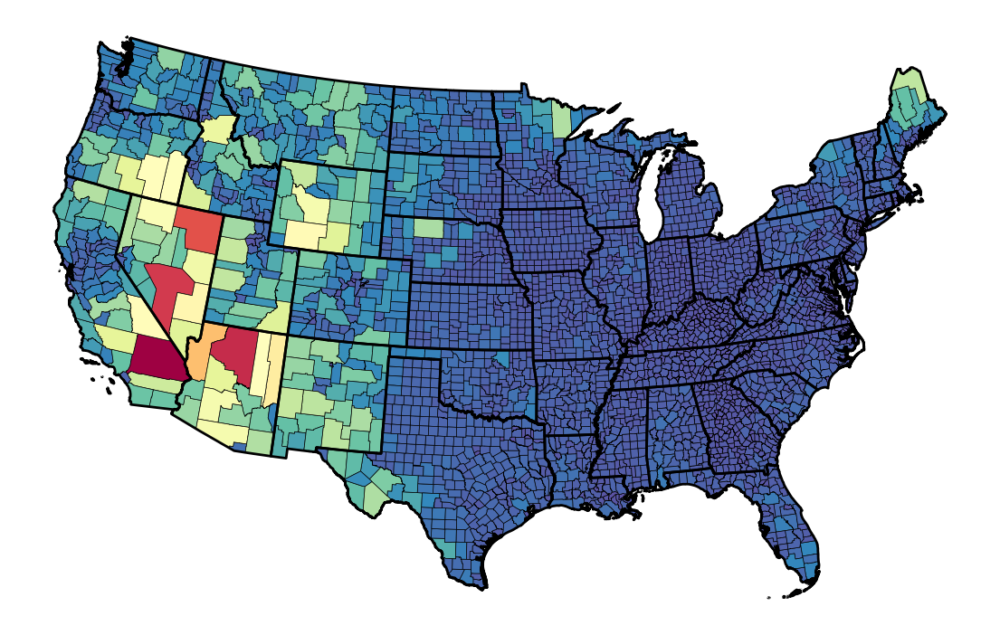

In [130]:
#Let's re-load our county and state geometries from last time
################

#Load the counties and states:
#URLs:
url_county = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_county_500k.zip'
url_state = 'https://www2.census.gov/geo/tiger/GENZ2021/shp/cb_2021_us_state_500k.zip'

#Load:
county_gdf = gpd.read_file(url_county)
state_gdf = gpd.read_file(url_state)

## Convert CRS to North American Albers, EPSG 5070
county_gdf = county_gdf.to_crs(5070)
state_gdf = state_gdf.to_crs(5070)

#Restrict to contiguous US
exclude_list = [15, 72, 2, 60, 66, 69, 78]

#~ is not
state_gdf = state_gdf.loc[~state_gdf['STATEFP'].astype(int).isin(exclude_list)]
county_gdf = county_gdf.loc[~county_gdf['STATEFP'].astype(int).isin(exclude_list)]


#ALSO: Add a FIPS code for the counties
county_gdf['FIPS'] = county_gdf.STATEFP + county_gdf.COUNTYFP


#Quick Check:
##########
fig, ax1 = plt.subplots(1,1, figsize=(14, 10))

#Draw the counties:
county_gdf.plot(ax = ax1, linewidth = .5, edgecolor = 'black', column = 'ALAND', cmap='Spectral_r')

#And the states as outline
state_gdf.plot(ax = ax1, linewidth = 2, edgecolor = 'black', facecolor = 'none')

ax1.set_axis_off()

In [131]:
### Get and Merge Census Data
####################

#Here's our URL:
url_name = r'https://www2.census.gov/programs-surveys/popest/datasets/2010-2020/counties/totals/co-est2020-alldata.csv'

#Load
df = pd.read_csv(url_name, encoding = "ISO-8859-1", engine='python')

#Create the FIPS:
df['FIPS'] = df.STATE.astype(str).str.zfill(2) + df.COUNTY.astype(str).str.zfill(3)

#Merge to create gdf_county_all
gdf_county_all = county_gdf.merge(df, left_on='FIPS', right_on='FIPS', how='left')

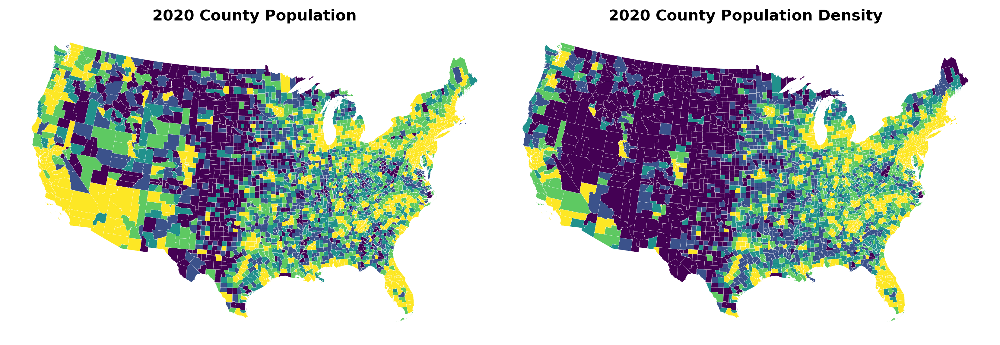

In [132]:
## Do a quick plot of county population, and population *density*
####

fig1, ax1 = plt.subplots(1,2, figsize=(14, 8), dpi=300)

#Population
#####
gdf_county_all.plot(ax=ax1[0], column='POPESTIMATE2020', edgecolor='white', linewidth=.1, scheme='quantiles', legend=False)
ax1[0].set_title('2020 County Population', fontweight='bold');

#Population Density
#####
gdf_county_all.plot(ax=ax1[1], column=gdf_county_all.POPESTIMATE2020 / gdf_county_all.ALAND * 1e6,
                    edgecolor='white', linewidth=.1, scheme='quantiles', legend=False)
ax1[1].set_title('2020 County Population Density', fontweight='bold');


#Set the axes off:
[ax1[i].set_axis_off() for i in range(2)];

plt.subplots_adjust(wspace=0)

## Now Let's Answer the Following Question: What counties have more cows than humans?

We'll need:

- County shapefiles (got em)
- Demographics for people (got these too)
- Demographics for cows! ("bovigraphics?")

### We have humans, time to get cows...

To get this, we consult, of course, the USDA National Agricultural Statistical Services (NASS) Quick Stats database!

<https://quickstats.nass.usda.gov/>

- Use the interface to get county-resolution inventory of CATTLE, INCL CALVES in 2020...

- We will then subsequently introduce the NASS Quick Stats API

In [133]:
#Now that we've downloaded our .csv file, let's load 'er up as usual
####

#Looking at csv file, it looks like 'State ANSI' and 'County ANSI' are the state and county FP codes, respectively
#Also looks like ' (D)' is used to indicate withheld data: Let's treat is as a NaN

fname = 'Data/cattle_2020_county.csv'
df_cattle = pd.read_csv(fname, na_values = ' (D)')

df_cattle.head()

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,AUTAUGA,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,"16,000",NaN
1,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,BULLOCK,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,"10,300",NaN
2,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,DALLAS,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,"25,500",NaN
3,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,ELMORE,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,"11,600",NaN
4,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,GREENE,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,"12,500",NaN


In [134]:
#Some checks here:
print(len(df_cattle))

3029


In [135]:
#Look at the types:
df_cattle.dtypes

Program              object
Year                  int64
Period               object
Week Ending         float64
Geo Level            object
State                object
State ANSI            int64
Ag District          object
Ag District Code      int64
County               object
County ANSI         float64
Zip Code            float64
Region              float64
watershed_code        int64
Watershed           float64
Commodity            object
Data Item            object
Domain               object
Domain Category      object
Value                object
CV (%)              float64
dtype: object

In [136]:
#And look at Value:
#We have unwanted commas!
df_cattle.Value

0       16,000
1       10,300
2       25,500
3       11,600
4       12,500
         ...  
3024    65,000
3025    43,500
3026    58,000
3027     4,000
3028    39,000
Name: Value, Length: 3029, dtype: object

In [137]:
#If we try to coerce to floats, we get NaN:
pd.to_numeric(df_cattle.Value, errors = 'coerce')


0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
3024   NaN
3025   NaN
3026   NaN
3027   NaN
3028   NaN
Name: Value, Length: 3029, dtype: float64

In [138]:
#One (and generally best) way to deal with this....
###############

#Do this once at the beginning of the script:
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8') 

#OR:
#locale.setlocale(locale.LC_ALL, '') 

#OR:
#locale.setlocale(locale.LC_NUMERIC, '') 

#A quick test:
locale.atof("1,000")

1000.0

In [139]:
#We'll reload and set (D) to '', and then use atof from locale to properly convert strings to floats:
#####

fname = 'Data/cattle_2020_county.csv'
df_cattle = pd.read_csv(fname)

#Set (D) to empty string
df_cattle['Value'].loc[df_cattle['Value'].str.contains('(D)') == True] = ''

#Use apply plus atof plus a lambda expression! Woo!
#'' will evaluate as False
####
df_cattle['Value'] = df_cattle['Value'].apply(lambda x: locale.atof(x) if x else np.NaN)

C:\Users\steff\AppData\Local\Temp\ipykernel_28296\1100589331.py:8: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df_cattle['Value'].loc[df_cattle['Value'].str.contains('(D)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\1100589331.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cattle['Value'].loc[df_cattle['Value'].str.contains('(D)') == True] = ''


In [140]:
#Did it work?
df_cattle['Value']

0       16000.0
1       10300.0
2       25500.0
3       11600.0
4       12500.0
         ...   
3024    65000.0
3025    43500.0
3026    58000.0
3027     4000.0
3028    39000.0
Name: Value, Length: 3029, dtype: float64

#### Deal with the commas at loading...

In [141]:
#We can also deal with the commas when loading:
#######

#Load: Set na_values
#Have "," denoting thousands
fname = 'Data/cattle_2020_county.csv'
df_cattle = pd.read_csv(fname, na_values = ' (D)', thousands = ',')

df_cattle.Value

0       16000.0
1       10300.0
2       25500.0
3       11600.0
4       12500.0
         ...   
3024    65000.0
3025    43500.0
3026    58000.0
3027     4000.0
3028    39000.0
Name: Value, Length: 3029, dtype: float64

### Alternative to Using Interface? The QuickStats API!

- But first, let's introduce APIs more generally...

## Introducting APIs

1. Introduce REST(ful) APIs

    - OpenNotify as minimal example
    
    - USDA QuickStats


### A  Brief Introduction to APIs

- "Application programming interface" (API)


- Concept developed in 1950s and 1960s: Essentially an interface and catalog for how to call and use various subroutines in a library


- Hence, "API specification"


- More generally, an API is a mechanism that allows two software components to communicate using a set of definitions and protocols

#### First documented library of reusable code/subroutines

- First API (though not by that name)!

<img src="programs_WWG_01.png" alt="drawing" style="width:500px;"/>

<img src="programs_WWG_02.png" alt="drawing" style="width:800px;"/>

<img src="programs_WWG_03.png" alt="drawing" style="width:700px;"/>

### Early API Concept

- User (programmer) need not know details of subroutine implementation


- Hardware independence


- Flexibility, rapid program development


## Web APIs

- Term "API" is now often used in reference to Web APIs (especially in data science context)


- Refers to a system/specification for allowing client software to communicate with a server


- Client/Server:

    - Client sends a request
    - Server sends a response
    
Several types of Web APIs, but let's restrict ourselves to **REST (Representational State Transfer)**, aka **RESTful**, APIs:

- Use HTTP to provide access to machine readable data in XML or **JSON** format
- **REST** refers to a set of architectural constraints
- Generally considered more flexible/scalable than alternatives, such as SOAP (Simple Object Access Protocol) APIs

### Minimal Example: Open Notify

Partially adapted from documentation at http://open-notify.org

We will use `requests` library

#### International Space Station Current Location

http://api.open-notify.org/iss-now.json

This API takes no inputs: We make a GET request, and we get some stuff back...

In [ ]:
#Output will look like this:
{
  "message": "success",
  "timestamp": UNIX_TIME_STAMP,
  "iss_position": {
    "latitude": CURRENT_LATITUDE,
    "longitude": CURRENT_LONGITUDE
  }
}

In [142]:
#To Access: Start with a GET request
###########

import requests
import json

response = requests.get("http://api.open-notify.org/iss-now.json")

In [143]:
type(response)

requests.models.Response

In [144]:
dir(response)

['__attrs__',
 '__bool__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_content',
 '_content_consumed',
 '_next',
 'apparent_encoding',
 'close',
 'connection',
 'content',
 'cookies',
 'elapsed',
 'encoding',
 'headers',
 'history',
 'is_permanent_redirect',
 'is_redirect',
 'iter_content',
 'iter_lines',
 'json',
 'links',
 'next',
 'ok',
 'raise_for_status',
 'raw',
 'reason',
 'request',
 'status_code',
 'text',
 'url']

In [146]:
#Check our status code:
print(response.status_code)

200


#### Some status codes:

- 200: Everything went super, got your result.
- 301: Server is redirecting you to a different endpoint.
- 400: Bad request
- 401: You’re not authenticated, you cur! Maybe you didn't send the right API credentials?
- 403: Forbidden!
- 404: Missing!
- 500: Something unexpected happened, but it's not your fault
- 503: Server isn't ready, it can't even.


<img src="oatmeal_tumbeasts/tb_sign1.png" alt="drawing" style="width:150px;"/>


In [147]:
#Let's see what we got from above:
response.json()

{'timestamp': 1690242491,
 'iss_position': {'latitude': '12.9258', 'longitude': '11.2503'},
 'message': 'success'}

In [148]:
#Our type is a dictionary
obj = response.json()
type(obj)

dict

In [149]:
#We can use json.dumps() to convert our Python dictionary to a string
#Add formatting, and print:
print(json.dumps(obj, sort_keys=True, indent=4))

{
    "iss_position": {
        "latitude": "12.9258",
        "longitude": "11.2503"
    },
    "message": "success",
    "timestamp": 1690242491
}


In [150]:
#And, we can go straight from a dictionary to a DataFrame:
df = pd.DataFrame(obj)
df

,timestamp,iss_position,message
latitude,1690242491,12.9258,success
longitude,1690242491,11.2503,success


In [151]:
#Perhaps more useful:
#####

pd.DataFrame(obj["iss_position"], index=[obj["timestamp"]])

,latitude,longitude
1690242491,12.9258,11.2503


In [152]:
#Note:
#We can go from timestamp to datetime
from datetime import datetime

print(datetime.fromtimestamp(df.timestamp[0]))

2023-07-24 16:48:11


#### How Many People Are In Space Right Now?

In [153]:
response = requests.get("http://api.open-notify.org/astros.json")

In [154]:
response.json()

{'number': 10,
 'people': [{'name': 'Sergey Prokopyev', 'craft': 'ISS'},
  {'name': 'Dmitry Petelin', 'craft': 'ISS'},
  {'name': 'Frank Rubio', 'craft': 'ISS'},
  {'name': 'Stephen Bowen', 'craft': 'ISS'},
  {'name': 'Warren Hoburg', 'craft': 'ISS'},
  {'name': 'Sultan Alneyadi', 'craft': 'ISS'},
  {'name': 'Andrey Fedyaev', 'craft': 'ISS'},
  {'name': 'Jing Haiping', 'craft': 'Tiangong'},
  {'name': 'Gui Haichow', 'craft': 'Tiangong'},
  {'name': 'Zhu Yangzhu', 'craft': 'Tiangong'}],
 'message': 'success'}

In [155]:
response.json()['people']

[{'name': 'Sergey Prokopyev', 'craft': 'ISS'},
 {'name': 'Dmitry Petelin', 'craft': 'ISS'},
 {'name': 'Frank Rubio', 'craft': 'ISS'},
 {'name': 'Stephen Bowen', 'craft': 'ISS'},
 {'name': 'Warren Hoburg', 'craft': 'ISS'},
 {'name': 'Sultan Alneyadi', 'craft': 'ISS'},
 {'name': 'Andrey Fedyaev', 'craft': 'ISS'},
 {'name': 'Jing Haiping', 'craft': 'Tiangong'},
 {'name': 'Gui Haichow', 'craft': 'Tiangong'},
 {'name': 'Zhu Yangzhu', 'craft': 'Tiangong'}]

In [156]:
#And as a DataFrame
pd.DataFrame(response.json()['people'])

,name,craft
0,Sergey Prokopyev,ISS
1,Dmitry Petelin,ISS
2,Frank Rubio,ISS
3,Stephen Bowen,ISS
4,Warren Hoburg,ISS
5,Sultan Alneyadi,ISS
6,Andrey Fedyaev,ISS
7,Jing Haiping,Tiangong
8,Gui Haichow,Tiangong
9,Zhu Yangzhu,Tiangong


## Back to QuickStats API

- Get yourself an API key

- Follow along for a quick demonstration of using the API

- We'll need the requests library

In [157]:
import requests

In [158]:
#Base call:
call = 'https://quickstats.nass.usda.gov/api/api_GET/' #?key=api key&{parameter ... parameter}&format={json | csv | xml'

#Parameters we'll set:
header = {'short_desc': 'CATTLE, INCL CALVES - INVENTORY', "year": 2020, "agg_level_desc":"COUNTY",
          "format":"json"}

#My API key: Get your own!
api_key_param = {'key':'D26FA37A-D088-305D-8F89-4B0DD05169CF'}

#Merge the dictionaries to "parameters"
parameters = api_key_param.copy()
parameters.update(header)


#Use requests.get:
####
response = requests.get(call, params=parameters)


In [159]:
response.url

'https://quickstats.nass.usda.gov/api/api_GET/?key=D26FA37A-D088-305D-8F89-4B0DD05169CF&short_desc=CATTLE%2C+INCL+CALVES+-+INVENTORY&year=2020&agg_level_desc=COUNTY&format=json'

In [160]:
#Examine the response:
response.status_code

200

In [161]:
#And now:
response.json()

{'data': [{'domaincat_desc': 'NOT SPECIFIED',
   'freq_desc': 'POINT IN TIME',
   'sector_desc': 'ANIMALS & PRODUCTS',
   'country_name': 'UNITED STATES',
   'state_alpha': 'AL',
   'short_desc': 'CATTLE, INCL CALVES - INVENTORY',
   'asd_desc': 'NORTHERN VALLEY',
   'class_desc': 'INCL CALVES',
   'watershed_desc': '',
   'commodity_desc': 'CATTLE',
   'state_fips_code': '01',
   'county_name': 'COLBERT',
   'watershed_code': '00000000',
   'group_desc': 'LIVESTOCK',
   'load_time': '2021-05-10 15:00:22.000',
   'county_ansi': '033',
   'location_desc': 'ALABAMA, NORTHERN VALLEY, COLBERT',
   'agg_level_desc': 'COUNTY',
   'util_practice_desc': 'ALL UTILIZATION PRACTICES',
   'zip_5': '',
   'prodn_practice_desc': 'ALL PRODUCTION PRACTICES',
   'CV (%)': '',
   'county_code': '033',
   'Value': '15,400',
   'reference_period_desc': 'FIRST OF JAN',
   'congr_district_code': '',
   'state_name': 'ALABAMA',
   'domain_desc': 'TOTAL',
   'statisticcat_desc': 'INVENTORY',
   'unit_desc': '

In [162]:
#Let's embed data in a DataFrame:

data_df = pd.DataFrame(response.json()['data'])

In [163]:
data_df

,domaincat_desc,freq_desc,sector_desc,country_name,state_alpha,short_desc,asd_desc,class_desc,watershed_desc,commodity_desc,...,unit_desc,year,state_ansi,begin_code,end_code,week_ending,source_desc,region_desc,asd_code,country_code
0,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,AL,"CATTLE, INCL CALVES - INVENTORY",NORTHERN VALLEY,INCL CALVES,,CATTLE,...,HEAD,2020,01,01,01,,SURVEY,,10,9000
1,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,AL,"CATTLE, INCL CALVES - INVENTORY",NORTHERN VALLEY,INCL CALVES,,CATTLE,...,HEAD,2020,01,01,01,,SURVEY,,10,9000
2,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,AL,"CATTLE, INCL CALVES - INVENTORY",NORTHERN VALLEY,INCL CALVES,,CATTLE,...,HEAD,2020,01,01,01,,SURVEY,,10,9000
3,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,AL,"CATTLE, INCL CALVES - INVENTORY",NORTHERN VALLEY,INCL CALVES,,CATTLE,...,HEAD,2020,01,01,01,,SURVEY,,10,9000
4,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,AL,"CATTLE, INCL CALVES - INVENTORY",NORTHERN VALLEY,INCL CALVES,,CATTLE,...,HEAD,2020,01,01,01,,SURVEY,,10,9000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3024,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,WY,"CATTLE, INCL CALVES - INVENTORY",SOUTHEAST,INCL CALVES,,CATTLE,...,HEAD,2020,56,01,01,,SURVEY,,50,9000
3025,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,WY,"CATTLE, INCL CALVES - INVENTORY",SOUTHEAST,INCL CALVES,,CATTLE,...,HEAD,2020,56,01,01,,SURVEY,,50,9000
3026,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,WY,"CATTLE, INCL CALVES - INVENTORY",SOUTHEAST,INCL CALVES,,CATTLE,...,HEAD,2020,56,01,01,,SURVEY,,50,9000
3027,NOT SPECIFIED,POINT IN TIME,ANIMALS & PRODUCTS,UNITED STATES,WY,"CATTLE, INCL CALVES - INVENTORY",SOUTHEAST,INCL CALVES,,CATTLE,...,HEAD,2020,56,01,01,,SURVEY,,50,9000


In [164]:
#Again, we have the issue:
data_df.Value

0        15,400
1        25,500
2        30,000
3        30,500
4        21,500
         ...   
3024     67,000
3025    125,000
3026     81,000
3027     60,000
3028     65,000
Name: Value, Length: 3029, dtype: object

In [165]:
#So we deal with it in the same way:
#####
import locale
from locale import atof

locale.setlocale(locale.LC_ALL, 'en_US.UTF-8') 

#Set missing data strings to ''
data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
data_df['Value'].loc[data_df['Value'].str.contains('(Z)') == True] = ''

#Convert:
data_df['Value'] = data_df['Value'].apply(lambda x: atof(x) if x else np.NaN)

#Plus, make a FIPS
data_df['FIPS'] = data_df['state_fips_code'] + data_df['county_ansi']

C:\Users\steff\AppData\Local\Temp\ipykernel_28296\4066751203.py:9: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\4066751203.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\4066751203.py:10: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  data_df['Value'].loc[data_df['Value'].str.contains('(Z)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\4066751203.py:10: SettingWith

In [166]:
data_df['Value']

0        15400.0
1        25500.0
2        30000.0
3        30500.0
4        21500.0
          ...   
3024     67000.0
3025    125000.0
3026     81000.0
3027     60000.0
3028     65000.0
Name: Value, Length: 3029, dtype: float64

## API Another Example: Area Harvested for Corn, 2017


In [167]:
#Base call:
call = 'https://quickstats.nass.usda.gov/api/api_GET/' #?key=api key&{parameter ... parameter}&format={json | csv | xml'

#Parameters we'll set:
header = {'short_desc': 'CORN, GRAIN - ACRES HARVESTED', "year": 2017, "agg_level_desc":"COUNTY",
          "domain_desc":"TOTAL", #"source_desc":"CENSUS",
          "format":"json"}

#My API key: Get your own!
api_key_param = {'key':'D26FA37A-D088-305D-8F89-4B0DD05169CF'}

#Merge the dictionaries to "parameters"
parameters = api_key_param.copy()
parameters.update(header)

#Use requests.get:
####
response = requests.get(call, params=parameters)


In [168]:
response

<Response [200]>

In [169]:
#Make the dataframe and clean up Values:

data_df = pd.DataFrame(response.json()['data'])

#Set missing data strings to ''
data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
data_df['Value'].loc[data_df['Value'].str.contains('(Z)') == True] = ''

#Convert:
data_df['Value'] = data_df['Value'].apply(lambda x: atof(x) if x else np.NaN)

#Plus, make a FIPS
data_df['FIPS'] = data_df['state_fips_code'] + data_df['county_ansi']

C:\Users\steff\AppData\Local\Temp\ipykernel_28296\3557406585.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\3557406585.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_df['Value'].loc[data_df['Value'].str.contains('(D)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\3557406585.py:7: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  data_df['Value'].loc[data_df['Value'].str.contains('(Z)') == True] = ''
C:\Users\steff\AppData\Local\Temp\ipykernel_28296\3557406585.py:7: SettingWithCo

In [170]:
#Join to geometries
#####

gdf_corn = gdf_county_all.merge(data_df, left_on = 'FIPS', right_on = 'FIPS', how='left')

In [171]:
gdf_corn

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,...,util_practice_desc,zip_5,county_ansi,load_time,commodity_desc,state_fips_code,watershed_desc,group_desc,watershed_code,county_name
0,20,161,00485044,0500000US20161,20161,Riley,Riley County,KS,Kansas,06,...,GRAIN,,161,2018-02-01 00:00:00.000,CORN,20,,FIELD CROPS,00000000,RILEY
1,19,159,00465268,0500000US19159,19159,Ringgold,Ringgold County,IA,Iowa,06,...,GRAIN,,159,2018-02-01 00:00:00.000,CORN,19,,FIELD CROPS,00000000,RINGGOLD
2,19,159,00465268,0500000US19159,19159,Ringgold,Ringgold County,IA,Iowa,06,...,GRAIN,,159,2018-02-22 15:08:35.000,CORN,19,,FIELD CROPS,00000000,RINGGOLD
3,30,009,01720111,0500000US30009,30009,Carbon,Carbon County,MT,Montana,06,...,GRAIN,,009,2018-02-01 00:00:00.000,CORN,30,,FIELD CROPS,00000000,CARBON
4,16,007,00395090,0500000US16007,16007,Bear Lake,Bear Lake County,ID,Idaho,06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4584,48,451,01384011,0500000US48451,48451,Tom Green,Tom Green County,TX,Texas,06,...,GRAIN,,451,2018-02-22 15:08:35.000,CORN,48,,FIELD CROPS,00000000,TOM GREEN
4585,39,089,01074057,0500000US39089,39089,Licking,Licking County,OH,Ohio,06,...,GRAIN,,089,2018-02-01 00:00:00.000,CORN,39,,FIELD CROPS,00000000,LICKING
4586,39,089,01074057,0500000US39089,39089,Licking,Licking County,OH,Ohio,06,...,GRAIN,,089,2019-03-21 15:28:35.000,CORN,39,,FIELD CROPS,00000000,LICKING
4587,19,193,00465285,0500000US19193,19193,Woodbury,Woodbury County,IA,Iowa,06,...,GRAIN,,193,2018-02-01 00:00:00.000,CORN,19,,FIELD CROPS,00000000,WOODBURY


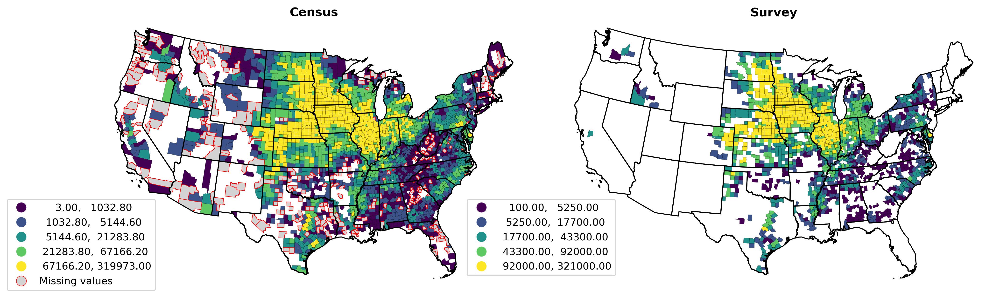

In [172]:
#And plot:
############

fig, ax1 = plt.subplots(1,2, figsize=(16, 10), dpi=300)

#Compare SURVEY and CENSUS:

gdf = gdf_corn.loc[gdf_corn.source_desc == 'CENSUS']
gdf.plot(ax=ax1[0], column = gdf.Value, edgecolor = 'black', linewidth=.1,
                cmap='viridis', scheme="quantiles", k=5,
                missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"},
                legend_kwds={'bbox_to_anchor':(0.15, 0.35)}, legend=True)

state_gdf.plot(facecolor='none', ax=ax1[0])

#######


gdf = gdf_corn.loc[gdf_corn.source_desc == 'SURVEY']
gdf.plot(ax=ax1[1], column = gdf.Value, edgecolor = 'black', linewidth=.1,
                cmap='viridis', scheme="quantiles", k=5,
                missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"},
                legend_kwds={'bbox_to_anchor':(0.15, 0.35)}, legend=True)

state_gdf.plot(facecolor='none', ax=ax1[1])


#######


ax1[0].set_title('Census', y=.975, fontweight='bold')
ax1[1].set_title('Survey', y=.975, fontweight='bold')

ax1[0].set_axis_off();
ax1[1].set_axis_off();

plt.subplots_adjust(wspace=.05)

## A little more QuickStats API:

### get_counts:

Get number of data items...

In [173]:
#Also have get_counts:
#######

call = 'https://quickstats.nass.usda.gov/api/get_counts/'

header = {"commodity_desc": "CORN", "year": 2017, "agg_level_desc":"COUNTY",
          "format":"json"}

api_key_param = {'key':'D26FA37A-D088-305D-8F89-4B0DD05169CF'}

#Merge the dictionaries
parameters = api_key_param.copy()
parameters.update(header)

response = requests.get(call, params=parameters)

response.json()

{'count': 54620}

### get_param_values:

Get possible parameter values:

In [174]:
call = 'https://quickstats.nass.usda.gov/api/get_param_values/' #?key=api key&{parameter ... parameter}&format={json | csv | xml'

header = {"param":"commodity_desc"}
api_key_param = {'key':'D26FA37A-D088-305D-8F89-4B0DD05169CF'}

#Merge the dictionaries
parameters = api_key_param.copy()
parameters.update(header)

response = requests.get(call, params=parameters)

response.json()

{'commodity_desc': ['AG LAND',
  'AG SERVICES',
  'AG SERVICES & RENT',
  'ALCOHOL COPRODUCTS',
  'ALMONDS',
  'ALPACAS',
  'AMARANTH',
  'ANIMAL PRODUCTS, OTHER',
  'ANIMAL SECTOR',
  'ANIMAL TOTALS',
  'ANIMALS, OTHER',
  'ANNUAL PPI',
  'APPLES',
  'APRICOTS',
  'AQUACULTURE TOTALS',
  'AQUACULTURE, OTHER',
  'AQUATIC PLANTS',
  'ARONIA BERRIES',
  'ARTICHOKES',
  'ASPARAGUS',
  'ASSETS',
  'AUTOMOBILES',
  'AUTOS',
  'AVOCADOS',
  'BAITFISH',
  'BANANAS',
  'BAREROOT HERBACEOUS PERENNIALS',
  'BARLEY',
  'BASIL',
  'BEANS',
  'BEDDING PLANT TOTALS',
  'BEDDING PLANTS, ANNUAL',
  'BEDDING PLANTS, HERBACEOUS PERENNIAL',
  'BEEF',
  'BEESWAX',
  'BEETS',
  'BERRIES, OTHER',
  'BERRY TOTALS',
  'BETEL NUTS',
  'BISON',
  'BITTERMELON',
  'BLACKBERRIES',
  'BLUEBERRIES',
  'BOATS',
  'BOYSENBERRIES',
  'BREADFRUIT',
  'BROCCOLI',
  'BRUSSELS SPROUTS',
  'BUCKWHEAT',
  'BUILDING MATERIALS',
  'BUILDINGS',
  'BULBS & CORMS & RHIZOMES & TUBERS',
  'BULBS & ROOTS',
  'BUSINESS ACTIVITY',
  

## Back to Cows...

In [175]:
#Recall, df_cattle:
#######

df_cattle.head()

,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,County,...,Zip Code,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%)
0,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,AUTAUGA,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,16000.0,NaN
1,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,BULLOCK,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,10300.0,NaN
2,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,DALLAS,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,25500.0,NaN
3,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,ELMORE,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,11600.0,NaN
4,SURVEY,2020,FIRST OF JAN,NaN,COUNTY,ALABAMA,1,BLACK BELT,40,GREENE,...,NaN,NaN,0,NaN,CATTLE,"CATTLE, INCL CALVES - INVENTORY",TOTAL,NOT SPECIFIED,12500.0,NaN


### Some other processing we need to do...

1. We have NAs for both County ANSI and for Value: Let's drop!
2. Make a FIPS code: Use zfill again
3. Let's rename Value to COWS
4. And drop everything but FIPS and COWS
5. Finally merge with our shapefiles + demographic data!

In [176]:
#Don't worry, we only miss a few cows:
df_cattle.loc[df_cattle['County ANSI'].isna()].Value.sum() / df_cattle.Value.sum()

0.001767998373270262

In [183]:
#The first four...
################

#1. Drop NAs:
df_cattle.dropna(subset = ['County ANSI', 'Value'], inplace=True)


#2. Make FIPS:
#Need the astype(int).astype(str) sequence to clip off the .0 for County ANSI
df_cattle['FIPS'] = df_cattle['State ANSI'].astype(int).astype(str).str.zfill(2) \
                    + df_cattle['County ANSI'].astype(int).astype(str).str.zfill(3)


#3. Rename Value to COWS
df_cattle = df_cattle.rename(columns = {'Value': 'COWS'})


#4. Just keep the FIPS code and COWS
df_cattle = df_cattle[['FIPS', 'COWS']]

In [184]:
#Let's see what we got:
df_cattle.head()

,FIPS,COWS
0,01001,16000.0
1,01011,10300.0
2,01047,25500.0
3,01051,11600.0
4,01063,12500.0


#### Now we can merge with `gdf_county_all` from above, and plot our cow populations!

In [185]:
#Let's do a left join so that we have NaNs where there is no cow data
#####

gdf_cattle = gdf_county_all.merge(df_cattle, left_on = 'FIPS', right_on = 'FIPS', how='left')

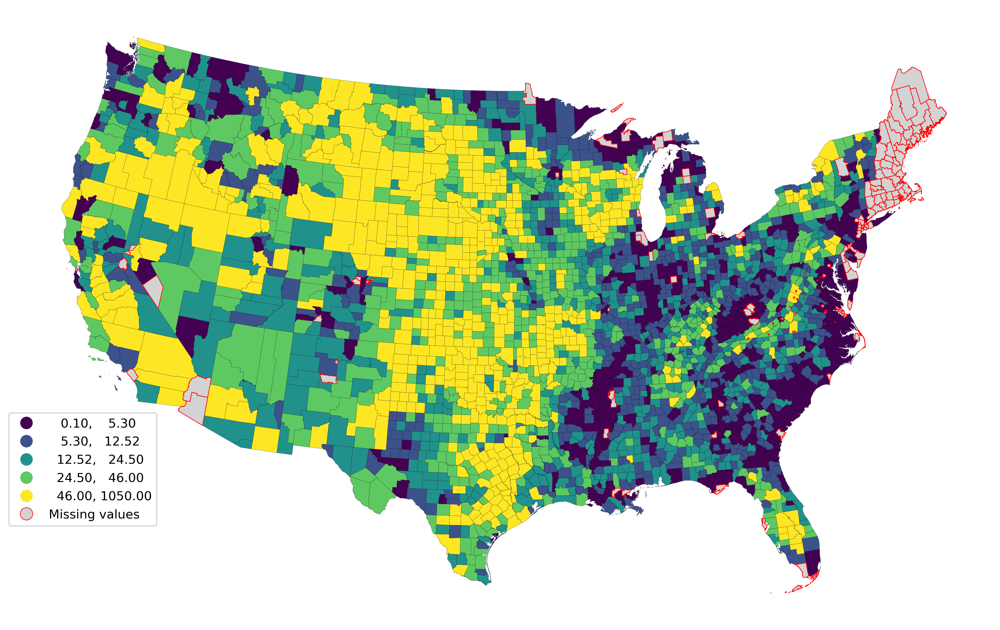

In [186]:
#Now, plot our lovely cow map!
############

fig, ax1 = plt.subplots(1,1, figsize=(14, 10), dpi=300)

#Plot in 1000s of Cows
gdf_cattle.plot(ax=ax1, column = gdf_cattle.COWS / 1e3, edgecolor = 'black', linewidth=.1,
                cmap='viridis', scheme="quantiles", k=5,
                missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"},
                legend_kwds={'bbox_to_anchor':(0.15, 0.35)}, legend=True)

ax1.set_axis_off();

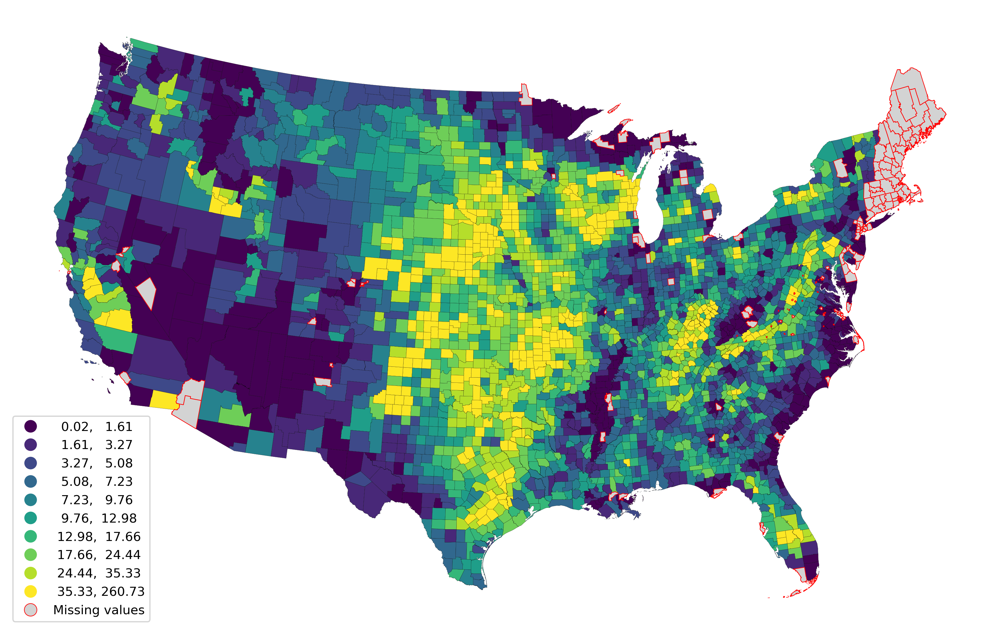

In [187]:
#Also, let's get cow population *density*
###########

#In cows per sq km
gdf_cattle['COW_DENSITY'] = gdf_cattle.COWS / gdf_cattle.ALAND * 1e6

fig, ax1 = plt.subplots(1,1, figsize=(14, 10), dpi=300)


#Plot:
gdf_cattle.plot(ax=ax1, column = gdf_cattle.COW_DENSITY, edgecolor = 'black', linewidth=.1,
                cmap='viridis', scheme="quantiles", k=10,
                missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"},
                legend_kwds={'bbox_to_anchor':(0.15, 0.35)}, legend=True)

ax1.set_axis_off();


## And which counties have more cows than humans?

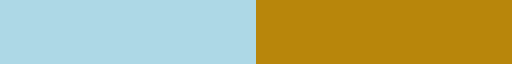

In [188]:
#Let's use a custom colormap:
from matplotlib.colors import ListedColormap

my_cmap = ListedColormap(["lightblue", "darkgoldenrod"], name='cow_map')
my_cmap

C:\Users\steff\AppData\Local\Temp\ipykernel_28296\1446601439.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_cattle['MORE_COWS'].loc[gdf_cattle['COWS_PER_PERSON'].notna()] = \


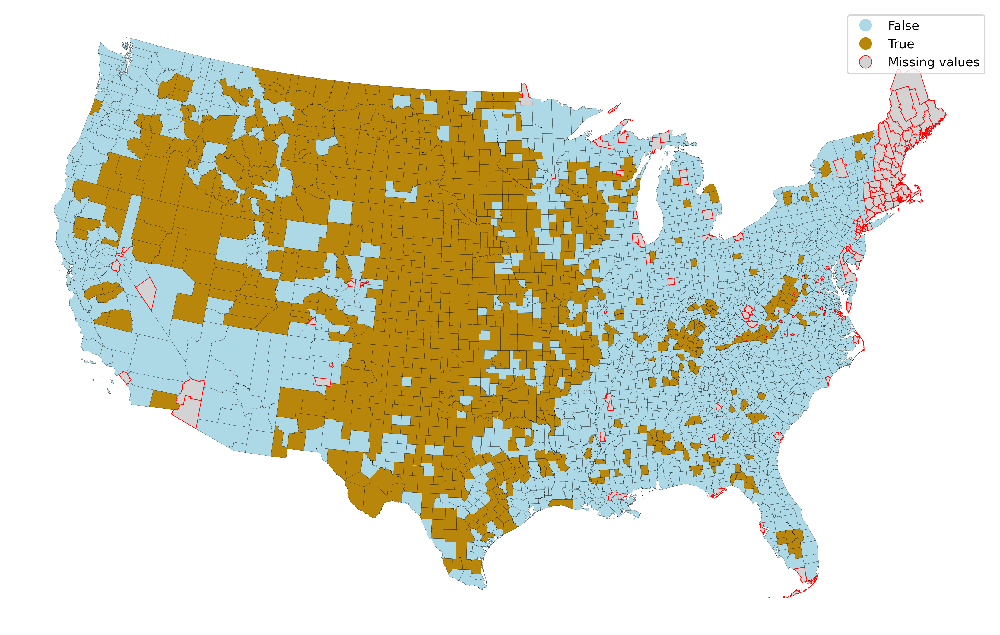

In [189]:
#Let's make a new variable that is cows per person, then threshold, and plot
#New Variable:
gdf_cattle['COWS_PER_PERSON'] = gdf_cattle.COWS / gdf_cattle.POPESTIMATE2020

#Keep NaNs:
gdf_cattle['MORE_COWS'] = np.NaN

gdf_cattle['MORE_COWS'].loc[gdf_cattle['COWS_PER_PERSON'].notna()] = \
            gdf_cattle['COWS_PER_PERSON'].loc[gdf_cattle['COWS_PER_PERSON'].notna()] > 1 


fig, ax1 = plt.subplots(1,1, figsize=(14, 10), dpi=300)

#Plot
gdf_cattle.plot(ax=ax1, column = 'MORE_COWS', linewidth=.1, edgecolor = 'black', cmap=my_cmap, alpha=1, legend=True,
           missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"})

ax1.set_axis_off();


### What fraction of the country, by land area, has more cows?

In [190]:
#Note we have a equal-area projection, so we're safe here:
#We have some missing data for the numerator, but probably safe to assume fewer cows than men

gdf_cattle.loc[gdf_cattle['MORE_COWS'] == 1].area.sum() / gdf_cattle.area.sum()

0.4587587676332099

### Most Cow-y Counties?

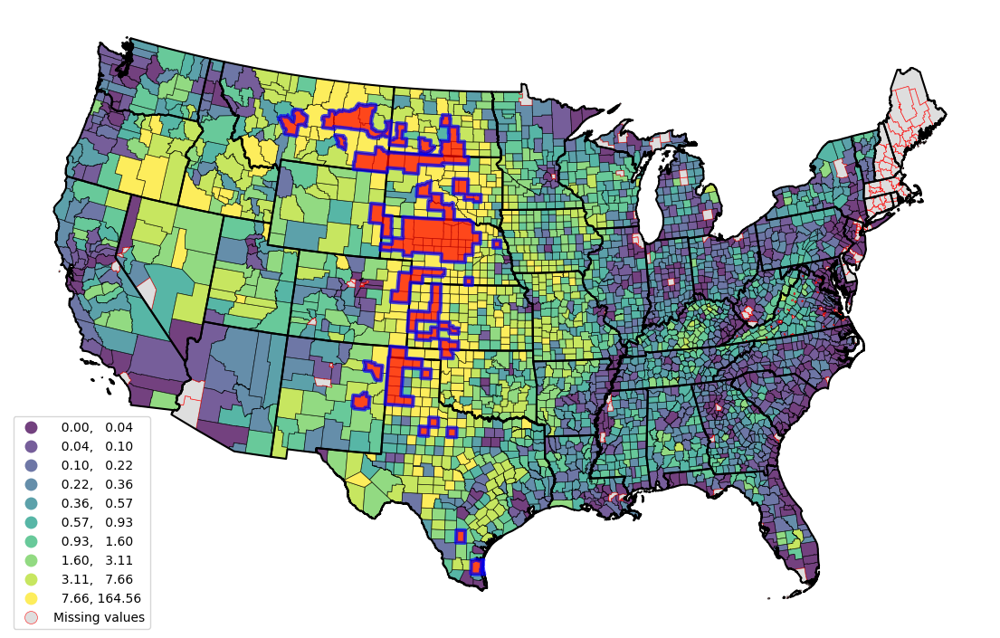

In [196]:
#Let' plot:
#######

fig, ax1 = plt.subplots(1,1, figsize=(14, 10))

#COWS vs. COWS_PER_PERSON vs. COW_DENSITY
var = 'COWS_PER_PERSON'
#var = 'COW_DENSITY'
#var = 'COWS'

gdf_cattle.plot(ax=ax1, column = gdf_cattle[var], linewidth=.5, edgecolor = 'black', cmap='viridis', alpha=.75,
           scheme="quantiles", k=10,
           missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"},
           legend_kwds={'bbox_to_anchor':(0.15, 0.35)}, legend=True)

#Add state outlines for reference
state_gdf.plot(ax = ax1, linewidth = 1.5, edgecolor = 'black', facecolor = 'none')


#And highlight the most cow-y county in the US: COWS vs COWS_PER_PERSON vs. COW_DENSITY
#Note iloc to highlight the top 50? [0:50]
#We throw in a dissolve!
gdf_cattle.sort_values(by=var, ascending=False).iloc[0:100].dissolve().plot(
    ax=ax1, facecolor='red', edgecolor='blue', alpha=.7, linewidth=3)


ax1.set_axis_off();

In [197]:
#Actual values?
gdf_cattle.sort_values(by=var, ascending=False).iloc[0:10]


,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,STATE_NAME,LSAD,...,RNETMIG2015,RNETMIG2016,RNETMIG2017,RNETMIG2018,RNETMIG2019,RNETMIG2020,COWS,COW_DENSITY,COWS_PER_PERSON,MORE_COWS
1946,31,183,00835913,0500000US31183,31183,Wheeler,Wheeler County,NE,Nebraska,06,...,-16.613419,25.284450,9.894867,-23.617154,-29.206349,-1.273885,130000.0,87.264844,164.556962,True
1121,20,081,00485328,0500000US20081,20081,Haskell,Haskell County,KS,Kansas,06,...,-6.840112,-20.954024,-4.972032,-14.228657,-11.027569,-25.790139,390000.0,260.734819,99.413714,True
744,48,261,01383916,0500000US48261,48261,Kenedy,Kenedy County,TX,Texas,06,...,4.555809,-32.258065,-47.904192,41.112455,-84.577114,-20.942408,37500.0,9.926786,98.944591,True
218,31,009,00835827,0500000US31009,31009,Blaine,Blaine County,NE,Nebraska,06,...,-31.088083,-29.661017,21.119324,-20.964361,-40.860215,8.771930,43000.0,23.360919,94.091904,True
490,48,269,01383920,0500000US48269,48269,King,King County,TX,Texas,06,...,66.420664,31.634446,-10.416667,-39.145907,-40.590406,50.909091,26000.0,11.020916,91.872792,True
2763,31,117,00835881,0500000US31117,31117,McPherson,McPherson County,NE,Nebraska,06,...,-44.044044,34.274194,-14.056225,2.026342,0.000000,-33.092037,40500.0,18.198480,85.443038,True
2322,31,165,00835904,0500000US31165,31165,Sioux,Sioux County,NE,Nebraska,06,...,-32.444959,-15.031646,-48.979592,-21.052632,-20.521590,31.382528,93000.0,17.374133,77.500000,True
233,31,005,00835825,0500000US31005,31005,Arthur,Arthur County,NE,Nebraska,06,...,4.434590,34.858388,-23.835320,17.410229,10.741139,-17.130621,35500.0,19.166039,76.180258,True
795,48,205,01383888,0500000US48205,48205,Hartley,Hartley County,TX,Texas,06,...,-65.113907,4.546249,-7.871261,-29.315093,-16.451234,-20.091324,405000.0,106.960755,74.407496,True
981,30,011,01688746,0500000US30011,30011,Carter,Carter County,MT,Montana,06,...,-11.319112,22.394488,37.546934,5.725971,11.345219,-12.903226,91000.0,10.518047,73.684211,True


## Aggegration with Dissolve: Recap

- Recall that we can aggegrate geometries using `dissolve()`

#### Example: Suppose we want cows by state

- Could download USDA again...But a more general method is to do aggregation via `dissolve`

#### Need to specificy `aggfunc`

Adopted from: https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html

Default is `first`. Our options include:

- `first`


- `last`


- `min`


- `max`


- `sum`


- `mean`


- `median`


- function


- string function name


- list of functions and/or function names, e.g. [np.sum, `mean`]


- **dict of axis labels -> functions, function names or list of such.**


In [198]:
#Now, let's specify our agg_func as 'sum':
###

gdf_cattle_state = gdf_cattle.dissolve(by='STATEFP', aggfunc='sum')


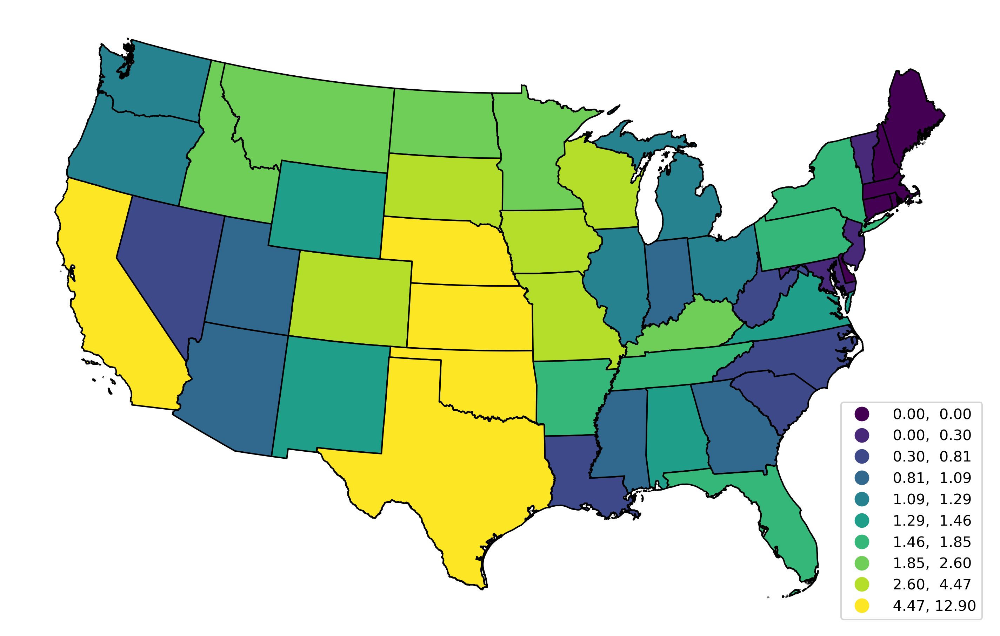

In [199]:
#And plot: Absolute number of cattle
####

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

#Convert to million cows:
gdf_cattle_state.plot(ax=ax1, column = gdf_cattle_state.COWS / 1e6,
                      edgecolor = 'black', cmap='viridis', scheme="quantiles", k=10,
                      legend=True, legend_kwds={'bbox_to_anchor':(1., 0.375)})

ax1.set_axis_off();

In [200]:
#Note the index now:
gdf_cattle_state.head()


,geometry,ALAND,AWATER,SUMLEV,REGION,DIVISION,STATE,COUNTY,ESTIMATESBASE2010,POPESTIMATE2010,...,RNETMIG2014,RNETMIG2015,RNETMIG2016,RNETMIG2017,RNETMIG2018,RNETMIG2019,RNETMIG2020,COWS,COW_DENSITY,COWS_PER_PERSON
STATEFP,,,,,,,,,,,,,,,,,,,,,
01,"MULTIPOLYGON (((746349.596 827181.513, 748515....",131175477769,4591897964,3350,201,402,67,4489,4780118,4785514,...,-134.011068,-104.417953,-151.013955,-140.168388,-88.827225,-47.130864,-10.310617,1300000.0,709.172744,44.183237
04,"POLYGON ((-1456521.134 1049554.379, -1466081.1...",294363973043,855871553,750,60,120,60,208,6392292,6407342,...,60.093671,27.339774,86.200595,45.108217,146.974037,159.848355,129.769010,846200.0,51.904192,4.870510
05,"POLYGON ((271938.335 1109471.096, 271707.724 1...",134660767709,3121950081,3750,225,525,375,5625,2916029,2921998,...,-359.103796,-307.112699,-193.105879,-89.622707,-163.381317,-165.481309,-250.292125,1730000.0,983.758539,86.042557
06,"MULTIPOLYGON (((-2274108.826 1816768.259, -227...",403671756816,20293573058,2900,232,522,348,3364,37254522,37319550,...,-37.015260,70.753636,52.144095,219.353415,-8.272552,-12.186239,-181.081661,5149600.0,853.712859,34.918275
08,"POLYGON ((-879811.915 1596563.386, -880588.238...",268418796417,1185716938,3200,256,512,512,3983,5029319,5047539,...,113.627522,387.014801,598.984627,616.881495,664.084126,247.681015,157.006707,2749800.0,560.425957,236.670490


In [ ]:
###
#Note that COWS_PER_PERSON, MORE_COWS, and COW_DENSITY are all meaningless now...
###

In [208]:
#Some more options for a very informative dissolve...

#Make a count variable to count the number of counties per state:
gdf_cattle['num_counties'] = 0

#Do some dissolvin!
gdf_cattle_state = gdf_cattle.dissolve(by='STATEFP',
                aggfunc={'num_counties': 'count',
                         'COWS': 'sum', #['sum', 'min', 'max'],
                         'POPESTIMATE2020': 'sum', #['sum', 'min', 'max']
                         'ALAND': 'sum',
                         'STUSPS': 'first'})

In [209]:
gdf_cattle_state.head()

,geometry,num_counties,COWS,POPESTIMATE2020,ALAND,STUSPS
STATEFP,,,,,,
01,"MULTIPOLYGON (((746349.596 827181.513, 748515....",67,1300000.0,4921532,131175477769,AL
04,"POLYGON ((-1456521.134 1049554.379, -1466081.1...",15,846200.0,7421401,294363973043,AZ
05,"POLYGON ((271938.335 1109471.096, 271707.724 1...",75,1730000.0,3030522,134660767709,AR
06,"MULTIPOLYGON (((-2274108.826 1816768.259, -227...",58,5149600.0,39368078,403671756816,CA
08,"POLYGON ((-879811.915 1596563.386, -880588.238...",64,2749800.0,5807719,268418796417,CO


In [210]:
#Can return index back to a column:
gdf_cattle_state = gdf_cattle_state.reset_index()

In [211]:
#And need to recalculate and any per-capita or density metrics:
#####

gdf_cattle_state['COWS_PER_PERSON'] = gdf_cattle_state.COWS / gdf_cattle_state.POPESTIMATE2020

gdf_cattle_state['COW_DENSITY'] = gdf_cattle_state.COWS / gdf_cattle_state.ALAND * 1e6

gdf_cattle_state['MORE_COWS'] = np.heaviside(gdf_cattle_state.COWS_PER_PERSON - 1, 0)

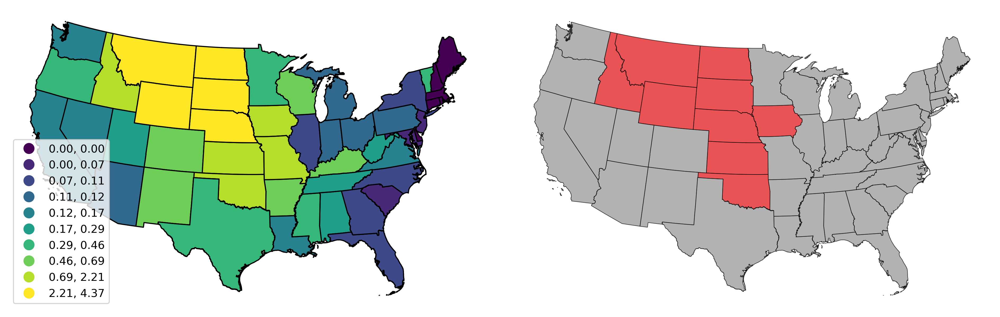

In [212]:
#Plot state-level results:
##########

fig, ax1 = plt.subplots(1,2, figsize=(16, 8), dpi=300)

gdf_cattle_state.plot(ax=ax1[0], column = 'COWS_PER_PERSON',
                      edgecolor = 'black', cmap='viridis', scheme="quantiles", k=10, legend=True,
                      legend_kwds={'loc':'lower left'})

gdf_cattle_state.plot(ax=ax1[1], column = 'MORE_COWS', linewidth=.5, edgecolor = 'black', cmap='Set1_r', alpha=.75,
           missing_kwds={"color": "lightgrey", "linewidth": .5, "edgecolor": "red", "label": "Missing values"})

ax1[0].set_axis_off();
ax1[1].set_axis_off();
plt.subplots_adjust(wspace=0.05)

#### Another Couple Dissolves:

<AxesSubplot: >

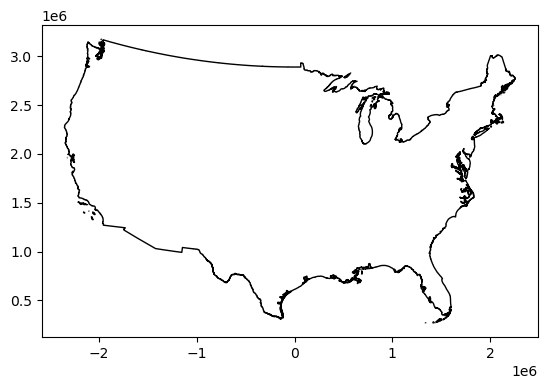

In [213]:
## Get US outline for plotting purposes:

nation_gdf = state_gdf.dissolve()
nation_gdf.plot(facecolor='none', linewidth=1, edgecolor='black')

<AxesSubplot: >

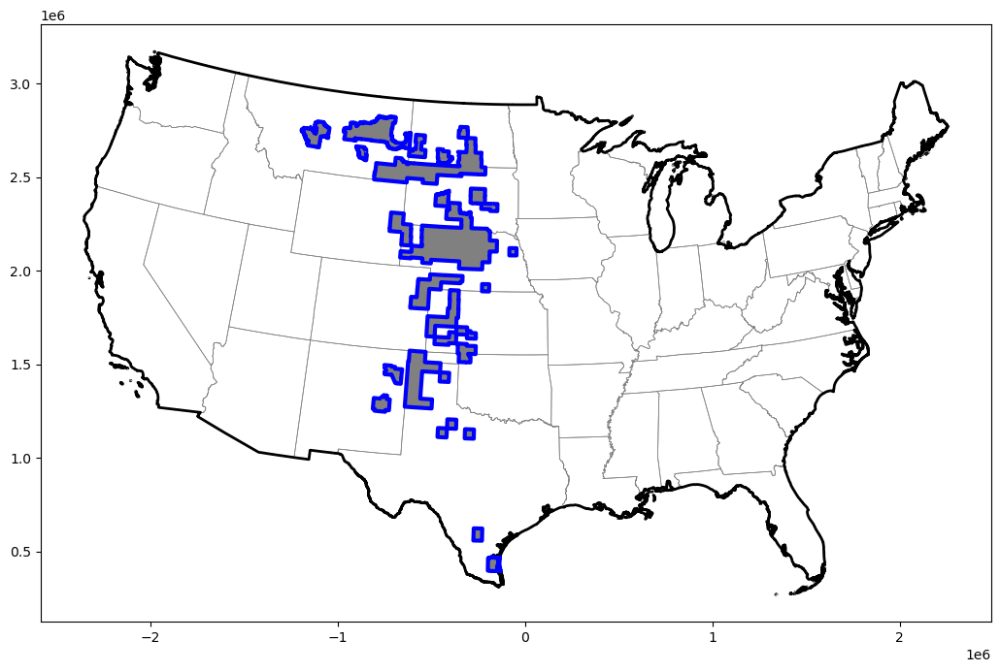

In [220]:
#What if we wanted to make the shape of the top X cow counties?
gdf_top_cattle = gdf_cattle.sort_values(by='COWS_PER_PERSON', ascending=False).iloc[0:100].dissolve(aggfunc='sum')


fig, ax1 = plt.subplots(1,1, figsize=(14, 8))

#Plot states/nation as background:
gdf_cattle_state.plot(ax=ax1, facecolor='none', linewidth=.5, edgecolor='grey')
nation_gdf.plot(ax=ax1, facecolor='none', linewidth=2, edgecolor='black')

gdf_top_cattle.plot(ax=ax1, facecolor='grey', edgecolor='blue', linewidth=3)



In [221]:
#How many cows in total? In millions
gdf_cattle_state.COWS.sum() / 1e6


93.2738

In [222]:
#And how many cows in our top X cow counties?
gdf_top_cattle.COWS / 1e6

0    11.079
Name: COWS, dtype: float64

### Save our Results for Next Time

- Let's save our results
- Drop the geometries and save as a csv file
- Just keep a subset of columns
- Will merge with the geometries when we load again

In [223]:
#Drop geometry:
gdf_cattle_save = gdf_cattle.drop(columns = ['geometry'])

In [224]:
#Just save these columns:
gdf_cattle_save[['FIPS', 'COWS', 'COWS_PER_PERSON', 'COW_DENSITY', 'POPESTIMATE2020']]

,FIPS,COWS,COWS_PER_PERSON,COW_DENSITY,POPESTIMATE2020
0,20161,29500.0,0.402994,18.681792,73202
1,19159,50000.0,10.414497,36.050785,4801
2,30009,78000.0,7.142203,14.706635,10921
3,16007,28500.0,4.639427,11.277646,6143
4,55011,63000.0,4.833883,35.994018,13033
...,...,...,...,...,...
3103,53003,10300.0,0.451358,6.252170,22820
3104,13043,3500.0,0.318616,5.559784,10985
3105,48451,41000.0,0.341638,10.400903,120010
3106,39089,22500.0,0.126334,12.729997,178100


In [225]:
#And save:
gdf_cattle_save[['FIPS', 'COWS', 'COWS_PER_PERSON', 'COW_DENSITY', 'POPESTIMATE2020']].\
to_csv('Data/2020_cattle_counties_processed.csv', index=False)

In [226]:
#Similar for states:
gdf_cattle_state[['STATEFP', 'COWS', 'COWS_PER_PERSON', 'COW_DENSITY', 'POPESTIMATE2020']].\
to_csv('Data/2020_cattle_states_processed.csv', index=False)